In [ ]:
!pip install onnx
!pip install openvino
#!pip install modelplace-api[vis]
#!pip install -U Pillow
!pip install /content/drive/MyDrive/data/car/lib/openvino_vehicle_license_plate_detection_barrier-0.2.1+cpu-py3-none-any.whl

Processing ./drive/MyDrive/data/car/lib/openvino_vehicle_license_plate_detection_barrier-0.2.1+cpu-py3-none-any.whl
  Using cached https://github.com/opencv-ai/modelplace-api/archive/v0.4.7.zip
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
openvino-vehicle-license-plate-detection-barrier is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.


In [ ]:
import sys
import os
from PIL import Image, ImageDraw,ImageFont
from openvino_vehicle_license_plate_detection_barrier import InferenceModel  # import the AI Model
from modelplace_api import Device

base_dir='/content/drive/MyDrive/data/car'

2021-09-18 08:36:34.636 | WARNING  | modelplace_api.visualization:<module>:31 - Some dependencies is invalid. Please install this package with extra requiements. For unix: pip install modelplace-api[vis] For windows: pip install modelplace-api[vis-windows]


In [ ]:
def run_model(path_to_image: str):
    image = Image.open(path_to_image).convert("RGB")  # Read an image
    model = InferenceModel(threshold=0.02)  # Initialize a model
    model.model_load(Device.cpu)  # Loading a model weights
    ret = model.process_sample(image)  # Processing an image
    return ret

/usr/local/lib/python3.7/dist-packages/openvino_vehicle_license_plate_detection_barrier/model.py:117: DeprecationWarning: Reading network using constructor is deprecated. Please, use IECore.read_network() method instead
  network=IENetwork(model=model_xml, weights=model_bin),
/usr/local/lib/python3.7/dist-packages/openvino_vehicle_license_plate_detection_barrier/model.py:121: DeprecationWarning: 'inputs' property of ExecutableNetwork class is deprecated. To access DataPtrs user need to use 'input_data' property of InputInfoCPtr objects which can be accessed by 'input_info' property.
  self.input_name = next(iter(self.net.inputs))


[BBox(x1=284, y1=52, x2=960, y2=1011, score=0.9999997615814209, class_name='vehicle'), BBox(x1=575, y1=919, x2=683, y2=967, score=0.026256073266267776, class_name='plate'), BBox(x1=1131, y1=114, x2=1213, y2=149, score=0.022263018414378166, class_name='plate')]


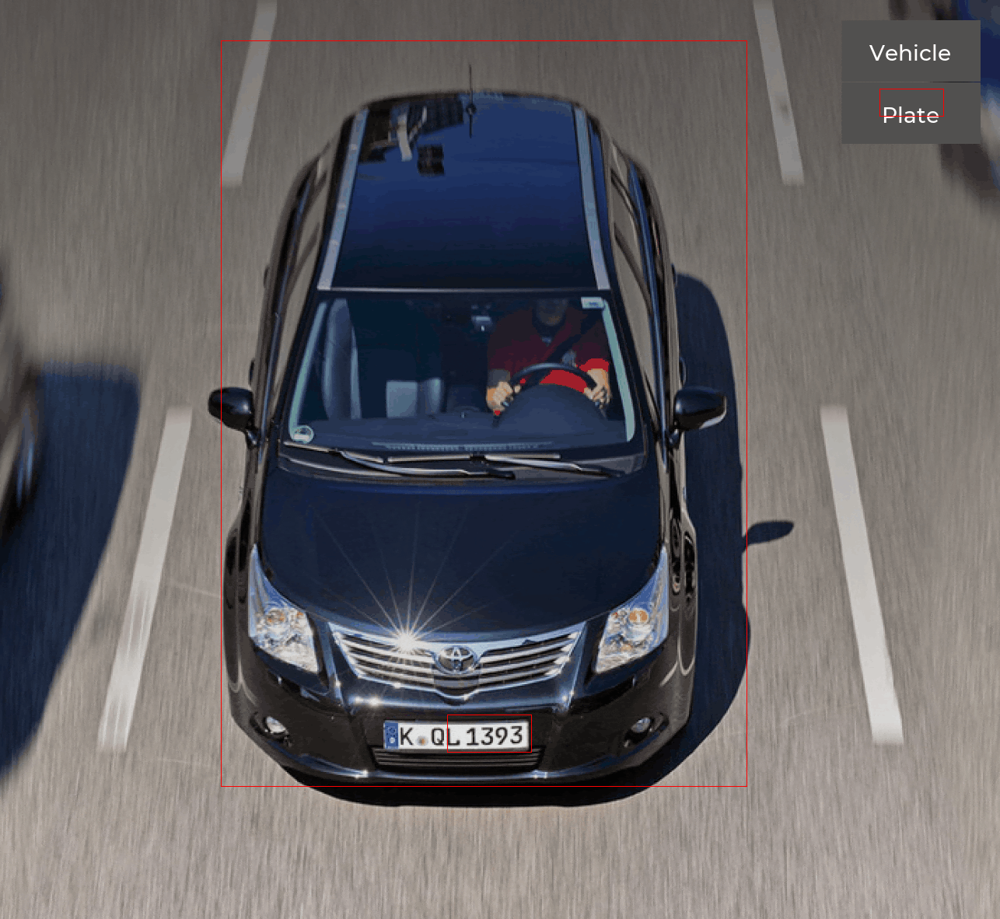

[]


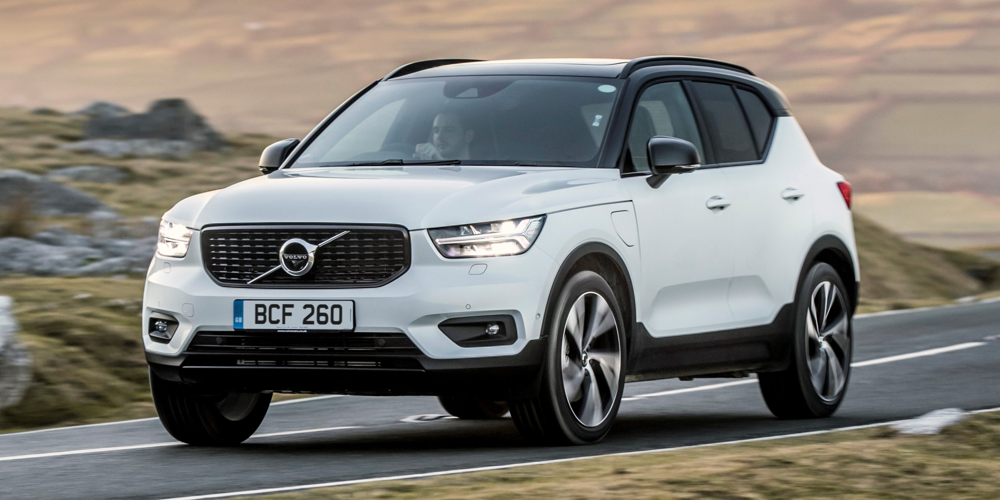

[]


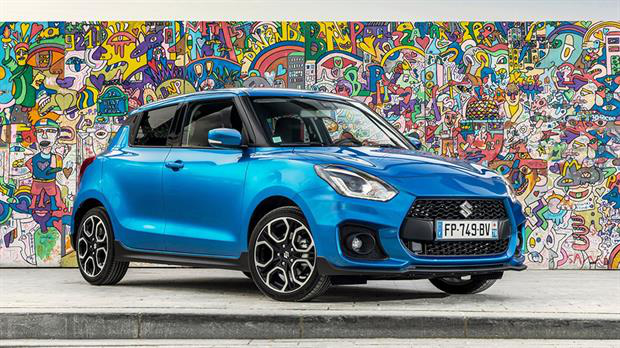

[BBox(x1=141, y1=19, x2=384, y2=155, score=0.055953655391931534, class_name='vehicle'), BBox(x1=272, y1=116, x2=301, y2=125, score=0.9847887754440308, class_name='plate')]


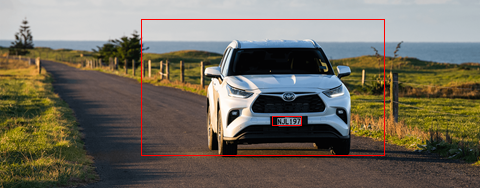

In [ ]:
def run():
    for test_file in [x for x in os.listdir(base_dir) if os.path.isfile(os.path.join(base_dir,x))]:         
        test_file=os.path.join(base_dir,test_file)
        out_put=run_model(test_file)
        print(out_put)
        source_img = Image.open(test_file).convert("RGB")
        draw = ImageDraw.Draw(source_img)
        for item in out_put:
                draw.rectangle(
                    ((item.x1, item.y1), (item.x2, item.y2)),
                    fill=None,
                    outline="red",
                )
        source_img.show()
run()        

Processing ./drive/MyDrive/data/car/lib/openvino_vehicle_detection_adas-0.2.1+cpu-py3-none-any.whl
  Using cached https://github.com/opencv-ai/modelplace-api/archive/v0.4.7.zip
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done


/usr/local/lib/python3.7/dist-packages/openvino_vehicle_detection_adas/model.py:112: DeprecationWarning: Reading network using constructor is deprecated. Please, use IECore.read_network() method instead
  network=IENetwork(model=model_xml, weights=model_bin),
/usr/local/lib/python3.7/dist-packages/openvino_vehicle_detection_adas/model.py:116: DeprecationWarning: 'inputs' property of ExecutableNetwork class is deprecated. To access DataPtrs user need to use 'input_data' property of InputInfoCPtr objects which can be accessed by 'input_info' property.
  self.input_name = next(iter(self.net.inputs))


[BBox(x1=240, y1=98, x2=1007, y2=1053, score=0.9367088675498962, class_name='vehicle'), BBox(x1=276, y1=4, x2=1286, y2=1182, score=0.021321892738342285, class_name='vehicle')]


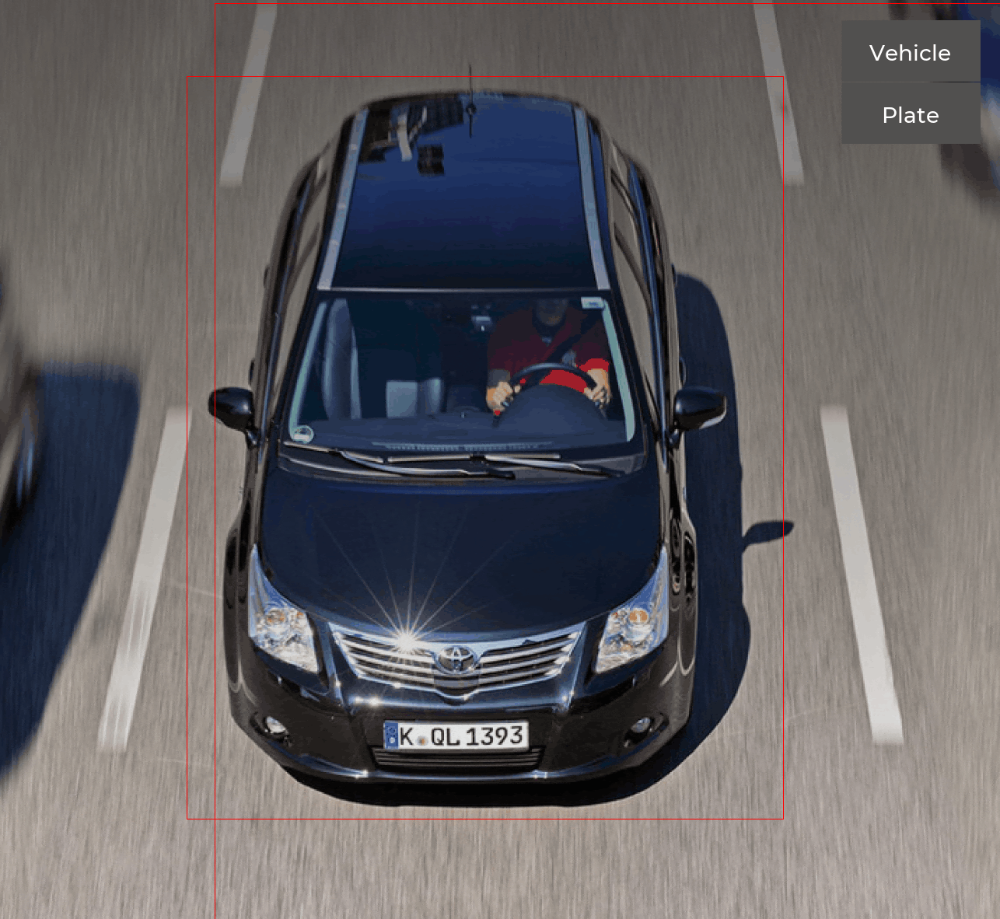

[BBox(x1=361, y1=107, x2=2177, y2=1252, score=0.17980287969112396, class_name='vehicle')]


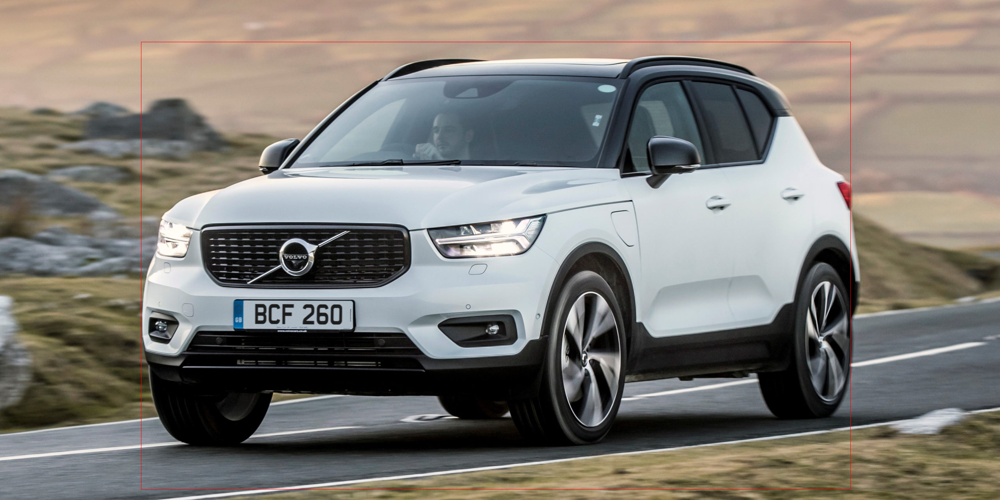

[BBox(x1=68, y1=93, x2=518, y2=298, score=0.5461224317550659, class_name='vehicle')]


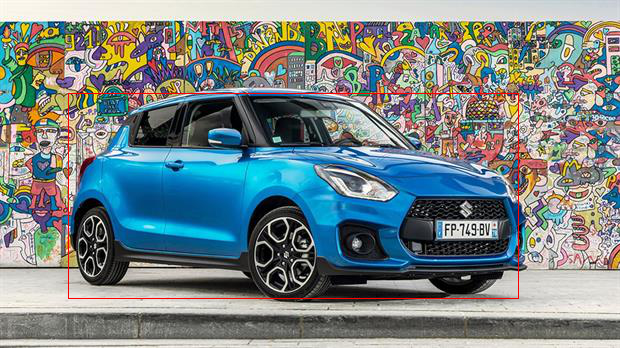

[BBox(x1=199, y1=39, x2=351, y2=158, score=0.7621989846229553, class_name='vehicle'), BBox(x1=336, y1=65, x2=351, y2=75, score=0.030744388699531555, class_name='vehicle'), BBox(x1=101, y1=63, x2=107, y2=67, score=0.02280493453145027, class_name='vehicle')]


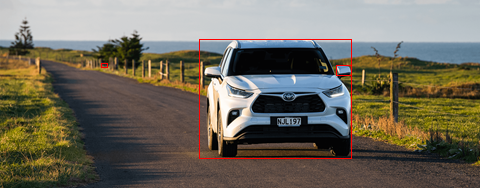

In [ ]:
!pip install /content/drive/MyDrive/data/car/lib/openvino_vehicle_detection_adas-0.2.1+cpu-py3-none-any.whl
from openvino_vehicle_detection_adas import InferenceModel  # import the AI Model
run()